## The file for experiments where the tokenization are fixed.

### Import and Set Figure Param

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import importlib

import utils.analysis_utils as analysis_utils
import utils.hallucination_utils as hallucination_utils
import utils.plotting_utils as plotting_utils
import utils.token_exp_utils as token_exp_utils
from utils.metric_utils import f1_score, exact_match_score
from scipy.stats import bootstrap

/home/kaiser/anaconda3/envs/qa/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [33]:
importlib.reload(mpl)

'/home/kaiser/anaconda3/envs/qa/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'

In [3]:
from matplotlib.font_manager import findfont, FontProperties

In [36]:
# Set plotting parameters
font = {'family' : 'serif',
        # 'weight' : 'bold',
        'size'   : 13}
mpl.rcParams['figure.dpi'] = 900
mpl.rc('font', **font)
mpl.rc('xtick', labelsize=13) 
plt.rcParams["font.family"] = "Nimbus Roman"
mpl.rc('ytick', labelsize=13) 

### Log Model Performance into CSV
It loads the default setup (lr, random seeds) and output them into a csv file under `post_eval_analysis/perf_outputs`

`base_dataset` is the dataset that the model is trained on

In [3]:
analysis_utils.produce_aggregate_csv(base_dataset='squad')
analysis_utils.produce_metric_csv(base_dataset='squad', metric_name='F1', avg_for_random_seeds=True)
analysis_utils.produce_metric_csv(base_dataset='squad', metric_name='EM', avg_for_random_seeds=True)

In [2]:
base_dataset='TriviaQA'
analysis_utils.produce_aggregate_csv(base_dataset=base_dataset)
analysis_utils.produce_metric_csv(base_dataset=base_dataset, metric_name='F1', avg_for_random_seeds=True)
analysis_utils.produce_metric_csv(base_dataset=base_dataset, metric_name='EM', avg_for_random_seeds=True)

In [4]:
base_dataset='NewsQA'
analysis_utils.produce_aggregate_csv(base_dataset=base_dataset)
analysis_utils.produce_metric_csv(base_dataset=base_dataset, metric_name='F1', avg_for_random_seeds=True)
analysis_utils.produce_metric_csv(base_dataset=base_dataset, metric_name='EM', avg_for_random_seeds=True)
print(analysis_utils.output_metric_for_single_model(base_dataset='NewsQA', metric_name='EM', model_name='google/t5-v1_1-base-tokenizer-fix', lr='1e-4', random_seed='0'))
print(analysis_utils.output_metric_for_single_model(base_dataset='NewsQA', metric_name='EM', model_name='google/t5-v1_1-base-tokenizer-fix', lr='1e-4', random_seed='42'))

{'squad': '71.7', 'NewsQA': '51.85', 'NaturalQuestions': '46.46', 'SearchQA': '37.56', 'TriviaQA': '54.8', 'bioasq': '41.89', 'duorc': '30.65', 'TextbookQA': '31.0'}
{'squad': '72.76', 'NewsQA': '51.8', 'NaturalQuestions': '46.24', 'SearchQA': '34.88', 'TriviaQA': '54.35', 'bioasq': '42.02', 'duorc': '31.38', 'TextbookQA': '30.74'}


In [ ]:
base_dataset='NaturalQuestions'
analysis_utils.produce_aggregate_csv(base_dataset=base_dataset)
analysis_utils.produce_metric_csv(base_dataset=base_dataset, metric_name='F1', avg_for_random_seeds=True)
analysis_utils.produce_metric_csv(base_dataset=base_dataset, metric_name='EM', avg_for_random_seeds=True)

### Are the performance difference significantly different?

In [51]:
importlib.reload(token_exp_utils)

<module 'utils.token_exp_utils' from '/home/kaiser/Desktop/QA-code-base/post_eval_analysis/utils/token_exp_utils.py'>

In [76]:
base_dataset = 'squad'
dataset_name = 'duorc'
bootstrap_res = token_exp_utils.significance_test("facebook/bart-base", dataset_name, base_dataset)
print(bootstrap_res)

Using custom data configuration default-bc046e071a6a2375
Reusing dataset csv (/home/kaiser/.cache/huggingface/datasets/csv/default-bc046e071a6a2375/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 715.75it/s]
Loading cached processed dataset at /home/kaiser/.cache/huggingface/datasets/csv/default-bc046e071a6a2375/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-fe6861d7b150bc83.arrow


BootstrapResult(confidence_interval=ConfidenceInterval(low=-0.014788931613188581, high=0.006840264136740391), standard_error=0.005492182725747304)


### Do modified BART strictly improve on the samples that it previously did wrong?
Result: No, but there are half less errors theat modified BART made.

In [ ]:
# Compute the instances where group1 has more mistakes and vice versa
group1 = ['facebook/bart-base-tokenizer']
group2 =['facebook/bart-base']
model_list = ['facebook/bart-base-tokenizer', 'facebook/bart-base']
dataset ='squad'
metric_fn=f1_score

# thresholds = [round(0.1 * i, 1) for i in range(5, 10)]
thresholds = [0.7, 0.8, 0.9, 1.0]
number_of_group1_mistaken_instances = []
number_of_group2_mistaken_instances = []
## Output commom mistakes of gen/ext to separate files
for threshold in thresholds:
    group1_mistaken_samples, group2_mistaken_samples = analysis_utils.common_mistakes_by_groups(dataset, model_list, group1, group2, metric_fn, threshold=threshold, base_dataset='squad')
    number_of_group1_mistaken_instances.append(len(group1_mistaken_samples))
    number_of_group2_mistaken_instances.append(len(group2_mistaken_samples))

Using custom data configuration default-eea83fcb5528ee90
Reusing dataset csv (/home/ec2-user/.cache/huggingface/datasets/csv/default-eea83fcb5528ee90/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 622.58it/s]
Loading cached processed dataset at /home/ec2-user/.cache/huggingface/datasets/csv/default-eea83fcb5528ee90/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-709ff7dc4a2d7634.arrow
Using custom data configuration default-eea83fcb5528ee90
Reusing dataset csv (/home/ec2-user/.cache/huggingface/datasets/csv/default-eea83fcb5528ee90/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 648.47it/s]
Loading cached processed dataset at /home/ec2-user/.cache/huggingface/datasets/csv/default-eea83fcb5528ee90/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-709ff7dc4a2d7634.arrow
Using custom data configuration default-eea83f

In [6]:
legend_labels = ['BART-tokenizer Mistakes', 'BART Mistakes']
plotting_utils.bar_plot([number_of_group1_mistaken_instances, number_of_group2_mistaken_instances], thresholds, legend_labels, title='# of samples for F1 thresholds in ' + dataset)

NameError: name 'number_of_group1_mistaken_instances' is not defined

In [ ]:
# Prepare the plotting data for purple area
ext_perf, gen_perf = analysis_utils.performance_for_each_instance(dataset, model_list, group1, group2, metric_fn, base_dataset='squad')

Using custom data configuration default-eea83fcb5528ee90
Reusing dataset csv (/home/ec2-user/.cache/huggingface/datasets/csv/default-eea83fcb5528ee90/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 593.09it/s]
Loading cached processed dataset at /home/ec2-user/.cache/huggingface/datasets/csv/default-eea83fcb5528ee90/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-709ff7dc4a2d7634.arrow


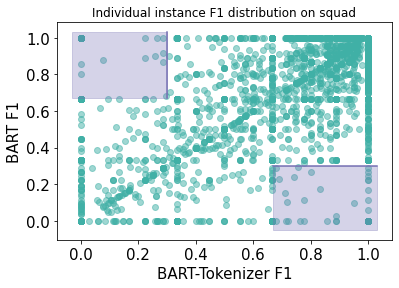

In [ ]:
alpha=0.3
metric_name = 'F1'
plt.scatter(ext_perf, gen_perf, c='#40B0A6', alpha=0.5)
plt.ylabel('BART ' + metric_name, fontsize=15)
plt.xlabel('BART-Tokenizer ' + metric_name, fontsize=15)
plt.plot([1-alpha-0.03, 1.03], [alpha, alpha], c='#7570B3')
plt.plot([alpha, alpha], [1-alpha-0.03, 1.03], c='#7570B3')
plt.fill_between([1-alpha-0.03, 1.03], [-0.05, -0.05], [alpha, alpha], alpha=0.3, color='#7570B3')
plt.fill_between([-0.03, alpha], [1-alpha-0.03, 1-alpha-0.03], [1.03, 1.03], alpha=0.3, color='#7570B3')
plt.title('Individual instance ' + metric_name + ' distribution on ' + dataset)
plt.show()

### Plot training curve

In [28]:
importlib.reload(analysis_utils)

<module 'utils.analysis_utils' from '/home/ec2-user/efs/users/huikans/QA-code-base/post_eval_analysis/utils/analysis_utils.py'>

In [13]:
model_names = ['facebook/bart-base', 'facebook/bart-base-tokenizer']
display_model_names = ['BART-base', 'BART-base-Token']
# model_names = ['google/t5-v1_1-base', 'google/t5-v1_1-base-tokenizer']
# display_model_names = ['T5-base', 'T5-base-Token']

target_model = "Bart"
base_dataset='squad'
model_colors = {'BART-base': '#D81B60', 'BART-base-Token': '#999999', 'T5-base': '#7570B3', 'T5-base-Token': '#E66100', 'T5-small': '#7570B3', 'T5-small-Token': '#E66100'}

#### 1. Plot training curve for all random seeds

In [14]:
fig, ax = plt.subplots(nrows=1, ncols=3)
fig.set_figheight(4)
fig.set_figwidth(20)

for model_idx, model_name in enumerate(model_names):
    # Load model's loss, F1, and EM
    losses, f1s, ems, loss_epochs, epochs = analysis_utils.load_training_curve_info(model_name, base_dataset)
    for seed in f1s.keys():
        ax[0].plot(loss_epochs, losses[seed], label=display_model_names[model_idx], color=model_colors[display_model_names[model_idx]], alpha=0.9)
        ax[1].plot(epochs, f1s[seed], label=display_model_names[model_idx], color=model_colors[display_model_names[model_idx]], alpha=0.9)
        ax[2].plot(epochs, ems[seed], label=display_model_names[model_idx],  color=model_colors[display_model_names[model_idx]], alpha=0.9)

ax[0].set_xlabel('Steps')
ax[0].set_ylabel('Loss')

ax[1].set_xlabel('Steps')
ax[1].set_ylabel('F1')

ax[2].set_xlabel('Steps')
ax[2].set_ylabel('EM')
f = lambda m,c: plt.plot([],[],marker=m, color=c, ls="none")[0]
handles = [f('_', model_colors[model]) for model in display_model_names]
labels = [model for model in display_model_names]
fig.legend(handles, labels)
fig.suptitle("Training curve on " + target_model)
# set the spacing between subplots
# plt.subplots_adjust(left=0.1,
#                     bottom=0.1, 
#                     right=0.9, 
#                     top=0.9, 
#                     wspace=0.4, 
#                     hspace=0.4)

Text(0.5, 0.98, 'Training curve on Bart')

#### 2. Plot training curve avg/max across random seeds

In [16]:
fig, ax = plt.subplots(nrows=1, ncols=3)
fig.set_figheight(4)
fig.set_figwidth(20)

for model_idx, model_name in enumerate(model_names):
    # Load model's loss, F1, and EM
    losses, f1s, ems, loss_epochs, epochs = analysis_utils.load_training_curve_info(model_name, base_dataset)
    tot_loss = []
    tot_f1s = []
    tot_ems = []
    for seed in f1s.keys():
        tot_loss.append(losses[seed])
        tot_f1s.append(f1s[seed])
        tot_ems.append(ems[seed])
    
    # TODO: Change here if you'd like to plot average instead of min of loss & max of perf among three random seeds
    ax[0].plot(loss_epochs, np.min(np.array(tot_loss), axis=0), label=display_model_names[model_idx], color=model_colors[display_model_names[model_idx]], alpha=0.9)
    ax[1].plot(epochs, np.max(np.array(tot_f1s), axis=0), label=display_model_names[model_idx], color=model_colors[display_model_names[model_idx]], alpha=0.9)
    ax[2].plot(epochs, np.max(np.array(tot_ems), axis=0), label=display_model_names[model_idx],  color=model_colors[display_model_names[model_idx]], alpha=0.9)

ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')

ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('F1')

ax[2].set_xlabel('Epoch')
ax[2].set_ylabel('EM')
f = lambda m,c: plt.plot([],[],marker=m, color=c, ls="none")[0]
handles = [f('_', model_colors[model]) for model in display_model_names]
labels = [model for model in display_model_names]
fig.legend(handles, labels)
# set the spacing between subplots
# plt.subplots_adjust(left=0.1,
#                     bottom=0.1, 
#                     right=0.9, 
#                     top=0.9, 
#                     wspace=0.4, 
#                     hspace=0.4)

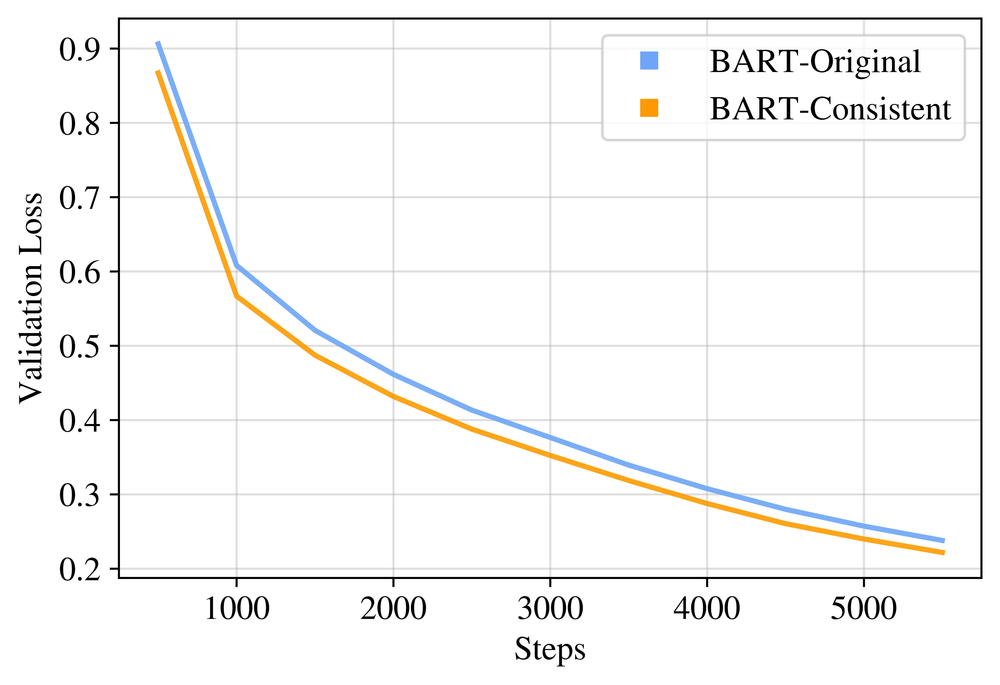

In [13]:
model_names = ['facebook/bart-base', 'facebook/bart-base-tokenizer']
display_model_names = ['BART-Original', 'BART-Consistent']
# model_names = ['google/t5-v1_1-base', 'google/t5-v1_1-base-tokenizer']
# display_model_names = ['T5-base', 'T5-base-Token']

target_model = "Bart"
base_dataset='NewsQA'
model_colors = {'BART-Original': '#6EA5F7', 'BART-Consistent': '#FF9900', 'T5-base': '#7570B3', 'T5-base-Token': '#E66100', 'T5-small': '#7570B3', 'T5-small-Token': '#E66100'}
fig, ax = plt.subplots()

for model_idx, model_name in enumerate(model_names):
    # Load model's loss, F1, and EM
    losses, f1s, ems, loss_epochs, epochs = analysis_utils.load_training_curve_info(model_name, base_dataset)
    tot_loss = []
    tot_f1s = []
    tot_ems = []
    for seed in f1s.keys():
        tot_loss.append(losses[seed])
        tot_f1s.append(f1s[seed])
        tot_ems.append(ems[seed])
    
    # TODO: Change here if you'd like to plot average instead of min of loss & max of perf among three random seeds
    ax.plot(loss_epochs, np.average(np.array(tot_loss), axis=0), label=display_model_names[model_idx], color=model_colors[display_model_names[model_idx]], alpha=0.9, linewidth=2.0)
    # ax[1].plot(epochs, np.max(np.array(tot_f1s), axis=0), label=display_model_names[model_idx], color=model_colors[display_model_names[model_idx]], alpha=0.9)
    # ax[2].plot(epochs, np.max(np.array(tot_ems), axis=0), label=display_model_names[model_idx],  color=model_colors[display_model_names[model_idx]], alpha=0.9)

ax.set_xlabel('Steps')
ax.set_ylabel('Validation Loss')
ax.grid(alpha=0.4)
f = lambda m,c: plt.plot([],[],marker=m, color=c, ls="none")[0]
handles = [f('s', model_colors[model]) for model in display_model_names]
labels = [model for model in display_model_names]
ax.legend(handles, labels)
plt.savefig(f"output/fig_files/LearningCurve_{base_dataset}.pdf", format="pdf", bbox_inches="tight")

### Perf v.s. Sequence Length

In [ ]:
importlib.reload(analysis_utils)
importlib.reload(plotting_utils)

<module 'plotting_utils' from '/home/ec2-user/efs/users/huikans/QA-code-base/post_eval_analysis/plotting_utils.py'>

In [15]:
def avg_across_setup(perf_dict, model_list, setup_model_list):
    # Averaged across different setup (lr, random seed) for each architecture
    averaged_dict = {}
    total_setup = {model : 0 for model in model_list}
    for model_setup in setup_model_list:
        for model in model_list:
            if model in model_setup:
                if model not in averaged_dict:
                    averaged_dict[model] = np.array(perf_dict[model_setup])
                else:
                    averaged_dict[model] += np.array(perf_dict[model_setup])
                total_setup[model] += 1
    
    # Compute average
    for model in averaged_dict:
        averaged_dict[model] /= total_setup[model]
    return averaged_dict

In [ ]:
model_list = [
            'facebook/bart-base',
            'facebook/bart-base-tokenizer',
            'google/t5-v1_1-base',
            'google/t5-v1_1-base-tokenizer'
            ]
display_model_list = [
            'bart-base',
            'bart-base-tokenizer',
            't5-v1_1-base',
            't5-v1_1-base-tokenizer'
            ]
dataset='bioasq'
ans_perfs, ans_lens, ans_len_counts, full_model_list = analysis_utils.perf_wrt_seq_len(dataset, model_list, num_buckets=20, metric_fn=f1_score, sequence_to_look='answers')
ans_perfs = avg_across_setup(ans_perfs, display_model_list, full_model_list)
print(ans_perfs)
print(ans_lens)
print(ans_len_counts[1:])

con_perfs, con_lens, con_len_counts, full_model_list = analysis_utils.perf_wrt_seq_len(dataset, model_list, num_buckets=8, metric_fn=f1_score, sequence_to_look='context')
con_perfs = avg_across_setup(con_perfs, display_model_list, full_model_list)
print(con_perfs)
print(con_lens)
print(con_len_counts[1:])

Using custom data configuration default-4db68f511a477386
Reusing dataset csv (/home/ec2-user/.cache/huggingface/datasets/csv/default-4db68f511a477386/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 629.87it/s]
Loading cached processed dataset at /home/ec2-user/.cache/huggingface/datasets/csv/default-4db68f511a477386/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-0321b25494e20793.arrow


{'bart-base': array([56.96470575, 56.92263277, 59.10274621, 52.85395001, 37.2194233 ,
       25.66196512]), 'bart-base-tokenizer': array([58.59159021, 59.56036712, 62.46268488, 52.86808976, 39.19001178,
       26.38986349]), 't5-v1_1-base': array([62.74211436, 61.17848351, 61.49987599, 73.48385331, 47.00580034,
       23.37008689]), 't5-v1_1-base-tokenizer': array([62.83305918, 62.17768927, 60.98958333, 74.76190476, 48.0393489 ,
       24.79727274])}
[1.0, 2.0, 3.0, 4.0, 6.0, 38.0]
[929, 309, 0, 0, 0, 0, 0, 0, 0, 0, 0, 192, 0, 0, 0, 0, 0, 0, 29, 29, 16]


Using custom data configuration default-4db68f511a477386
Reusing dataset csv (/home/ec2-user/.cache/huggingface/datasets/csv/default-4db68f511a477386/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 618.90it/s]
Loading cached processed dataset at /home/ec2-user/.cache/huggingface/datasets/csv/default-4db68f511a477386/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-0321b25494e20793.arrow


{'bart-base': array([63.34465163, 60.13612071, 59.84457494, 59.76297188, 52.69448927,
       51.02225673, 54.11424652, 52.04885029, 53.15455651]), 'bart-base-tokenizer': array([65.33094936, 61.3503189 , 61.27775359, 60.6168433 , 56.2119294 ,
       50.85181899, 58.90701548, 54.9136468 , 54.93640935]), 't5-v1_1-base': array([69.60048722, 62.28226712, 65.15230496, 62.36962816, 63.13175577,
       57.50839912, 57.04585538, 57.30671844, 59.69412403]), 't5-v1_1-base-tokenizer': array([70.13161138, 62.65469877, 65.62586986, 61.72408411, 63.75206933,
       58.20050205, 56.86654909, 57.14664441, 60.1523218 ])}
[125.0, 160.0, 189.0, 201.82142857142856, 219.0, 239.0, 254.0, 286.0, 639.0]
[189, 189, 169, 151, 163, 161, 162, 159, 161]


<Figure size 432x288 with 0 Axes>

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


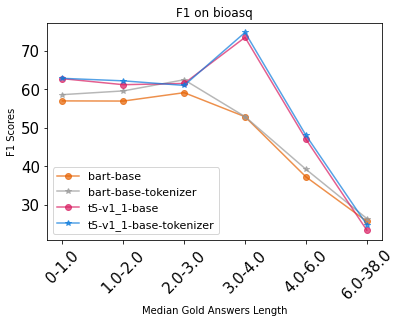

<Figure size 432x288 with 0 Axes>

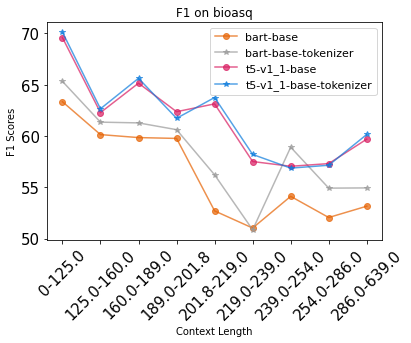

In [ ]:
# (by space separated tokens)
plotting_utils.plot_perf_wrt_seq(ans_perfs, ans_lens, 'Median Gold Answers Length', display_model_list, 'F1', dataset=dataset)
plotting_utils.plot_perf_wrt_seq(con_perfs, con_lens, 'Context Length', display_model_list, 'F1', dataset=dataset)

### Hallucination Rate After Fixed

In [79]:
importlib.reload(hallucination_utils)
importlib.reload(plotting_utils)

<module 'utils.plotting_utils' from '/home/kaiser/Desktop/QA-code-base/post_eval_analysis/utils/plotting_utils.py'>

In [80]:
# Compute the hallucination rate after fixing the tokenization
# The model name has to contain '-tokenizer' if want the fixed tokenization version
# model_list = ['facebook/bart-base', 'facebook/bart-base-tokenizer', 'google/t5-v1_1-base', 'google/t5-v1_1-base-tokenizer']
model_list = ['facebook/bart-base', 'facebook/bart-base-tokenizer']
metric_name = 'F1'
base_dataset='NewsQA'
domain_v_hallu, domain_v_perf, datasets, full_model_list = hallucination_utils.domain_vs_hallucination(model_list, base_dataset, metric_name=metric_name)

Using custom data configuration default-b29ec0752e396e02
Reusing dataset csv (/home/kaiser/.cache/huggingface/datasets/csv/default-b29ec0752e396e02/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 878.39it/s]
Loading cached processed dataset at /home/kaiser/.cache/huggingface/datasets/csv/default-b29ec0752e396e02/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-01965b81bd046a01.arrow
Using custom data configuration default-2cb491286246ec27
Reusing dataset csv (/home/kaiser/.cache/huggingface/datasets/csv/default-2cb491286246ec27/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 724.78it/s]
Loading cached processed dataset at /home/kaiser/.cache/huggingface/datasets/csv/default-2cb491286246ec27/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-c36bd1743056cabc.arrow
Using custom data configuration default-ce92932c347e95

In [14]:
print(full_model_list)

['facebook/bart-base-2e-5-0', 'facebook/bart-base-2e-5-42', 'facebook/bart-base-2e-5-12345', 'facebook/bart-base-tokenizer-2e-5-0', 'facebook/bart-base-tokenizer-2e-5-42', 'facebook/bart-base-tokenizer-2e-5-12345', 'google/t5-v1_1-base-1e-4-0', 'google/t5-v1_1-base-1e-4-42', 'google/t5-v1_1-base-1e-4-12345', 'google/t5-v1_1-base-tokenizer-1e-4-0', 'google/t5-v1_1-base-tokenizer-1e-4-42', 'google/t5-v1_1-base-tokenizer-1e-4-12345']


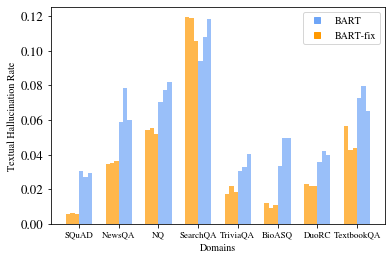

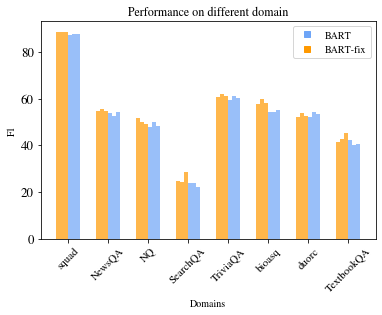

In [23]:
model_colors = {'bart': '#6EA5F7', 'bart-base-tokenizer': '#FF9900', 't5-v1_1-base': '#0C7BDC', 't5-v1_1-base-tokenizer': '#40B0A6', 't5-v1_1-small': '#0C7BDC', 't5-v1_1-small-tokenizer': '#40B0A6'}
display_name = {'bart': 'BART', 'bart-base-tokenizer': 'BART-fix', 't5-v1_1-base': 'T5', 't5-v1_1-base-tokenizer': 'T5-fix'}
display_datasets = {'squad': 'SQuAD', 'NQ': 'NQ', 'bioasq': 'BioASQ', 'NewsQA': 'NewsQA', 'duorc': 'DuoRC', 'TextbookQA': 'TextbookQA', 'TriviaQA': 'TriviaQA', 'SearchQA': 'SearchQA'}
x = np.arange(len(datasets))  # the label locations
width = 0.66 / len(full_model_list)   # the width of the bars
fig, ax = plt.subplots()
# print(domain_v_hallu)
used_colors = {}
datasets = list(map(lambda x: x.replace('NaturalQuestions', 'NQ'), datasets))
dis_datasets = [display_datasets[x] for x in datasets]
for model_idx, model in enumerate(full_model_list):
    for model_name in model_colors:
        if model_name in model:
            if 'tokenizer' in model:
                if 'tokenizer' in model_name:
                    color = model_colors[model_name]
                    used_colors[model_name] = color
            else:
                color = model_colors[model_name]
                used_colors[model_name] = color
    rects = ax.bar(x + width * (len(full_model_list) / 2 - model_idx - 0.5), domain_v_hallu[model_idx], width, label=model, color=color, alpha=0.7)

f = lambda m,c: plt.plot([],[],marker=m, color=c, ls="none")[0]
handles = [f('s', used_colors[model]) for model in used_colors]
labels = [display_name[model] for model in used_colors]

ax.set_ylabel('Textual Hallucination Rate')
ax.set_xlabel('Domains')
# ax.set_title('Hallucination rate on different domain, base dataset = ' + base_dataset)
# ax.set_xticks(x, datasets, fontsize=9.5)
ax.set_xticks(x, dis_datasets, fontsize=9)
ax.legend(handles, labels)
plt.show()

x = np.arange(len(datasets))  # the label locations
width = 0.6 / len(full_model_list)   # the width of the bars
fig, ax = plt.subplots()
for model_idx, model in enumerate(full_model_list):
    for model_name in model_colors:
        if model_name in model:
            color = model_colors[model_name]
    rects = ax.bar(x + width * (len(full_model_list) / 2 - model_idx - 0.5), domain_v_perf[model_idx], width, label=model, color=color, alpha=0.7)

ax.set_ylabel(metric_name)
ax.set_xlabel('Domains')
ax.set_title('Performance on different domain')
ax.set_xticks(x, datasets, fontsize=11, rotation=45)
ax.legend(handles, labels)
plt.show()

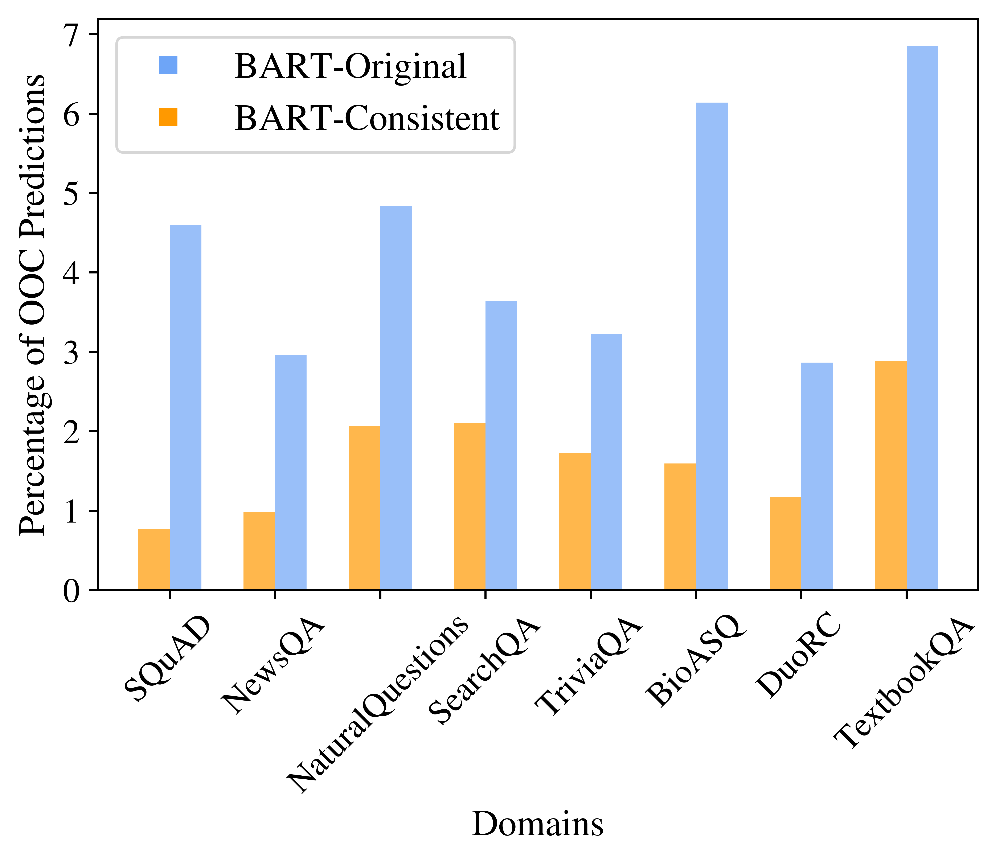

In [24]:
## Plotting code for paper, compute the average of HR for each model

model_colors = {'bart': '#6EA5F7', 'bart-base-tokenizer': '#FF9900', 't5-v1_1-base': '#0C7BDC', 't5-v1_1-base-tokenizer': '#40B0A6', 't5-v1_1-small': '#0C7BDC', 't5-v1_1-small-tokenizer': '#40B0A6'}
display_name = {'bart': 'BART-Original', 'bart-base-tokenizer': 'BART-Consistent', 't5-v1_1-base': 'T5', 't5-v1_1-base-tokenizer': 'T5-fix'}
display_datasets = {'squad': 'SQuAD', 'NQ': 'NaturalQuestions', 'bioasq': 'BioASQ', 'NewsQA': 'NewsQA', 'duorc': 'DuoRC', 'TextbookQA': 'TextbookQA', 'TriviaQA': 'TriviaQA', 'SearchQA': 'SearchQA'}
# Compute the average HR
performance = dict()
for name in display_name:
    performance[name] = 0.0
for model_idx, model in enumerate(full_model_list):
    for model_name in model_colors:
        if model_name in model:
            if 'tokenizer' in model:
                if 'tokenizer' in model_name:
                    performance[model_name] += domain_v_hallu[model_idx]
            else:
                performance[model_name] += domain_v_hallu[model_idx]

x = np.arange(len(datasets))  # the label locations
width = 1.2 / len(performance.keys())   # the width of the bars
fig, ax = plt.subplots()
# print(domain_v_hallu)
used_colors = {}
datasets = list(map(lambda x: x.replace('NaturalQuestions', 'NQ'), datasets))
dis_datasets = [display_datasets[x] for x in datasets]

for idx, model_name in enumerate(performance.keys()):
    if 'bart' in model_name:
        color = model_colors[model_name]
        used_colors[model_name] = color
        rects = ax.bar(x + width * (len(performance.keys()) / 2 - idx - 1.5), performance[model_name] / 3.0 * 100, width, label=model, color=color, alpha=0.7)

f = lambda m,c: plt.plot([],[],marker=m, color=c, ls="none")[0]
handles = [f('s', used_colors[model]) for model in used_colors]
labels = [display_name[model] for model in used_colors]

ax.set_ylabel('Percentage of OOC Predictions', fontsize=14)
ax.set_xlabel('Domains', fontsize=14)
# ax.set_title('Hallucination rate on different domain, base dataset = ' + base_dataset)
# ax.set_xticks(x, datasets, fontsize=9.5)
ax.set_xticks(x, dis_datasets, fontsize=13, rotation=45)
ax.legend(handles, labels, fontsize=14)
# plt.show()
plt.savefig(f"output/fig_files/{base_dataset}_hallucination.pdf", format="pdf", bbox_inches="tight")

### Question-Cnotext Overlap
1. Question-context overlap v.s. hallucination rate
2. Question-context overlap v.s. F1

In [ ]:
model_list = ['facebook/bart-base', 'facebook/bart-base-tokenizer', 'google/t5-v1_1-base', 'google/t5-v1_1-base-tokenizer']
display_model_list = ['bart-base', 'bart-base-tokenizer', 't5-v1_1-base', 't5-v1_1-base-tokenizer']
dataset='bioasq'
n_gram = 2
hallu, overlap_rates, overlap_counts, gen_model_list = hallucination_utils.qc_overlap_vs_hallucination(dataset, model_list, num_buckets=5, n_gram=n_gram)
hallu = avg_across_setup(hallu, display_model_list, gen_model_list)
print(hallu)
print(overlap_rates)
print(overlap_counts)

Using custom data configuration default-4db68f511a477386
Reusing dataset csv (/home/ec2-user/.cache/huggingface/datasets/csv/default-4db68f511a477386/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 629.02it/s]
Loading cached processed dataset at /home/ec2-user/.cache/huggingface/datasets/csv/default-4db68f511a477386/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-0321b25494e20793.arrow


{'bart-base': array([0.03171753, 0.02985075, 0.02462121, 0.02793834, 0.02777778,
       0.01769088]), 'bart-base-tokenizer': array([0.01077199, 0.0199005 , 0.01767677, 0.00963391, 0.00883838,
       0.0018622 ]), 't5-v1_1-base': array([0.01047277, 0.01741294, 0.01262626, 0.00289017, 0.00126263,
       0.01675978]), 't5-v1_1-base-tokenizer': array([0.01137044, 0.0199005 , 0.01515152, 0.00385356, 0.00252525,
       0.01675978])}
[0.0, 0.09090909090909091, 0.14285714285714285, 0.2, 0.3333333333333333, 1.0]
[0, 557, 67, 264, 173, 264, 179]


<Figure size 432x288 with 0 Axes>

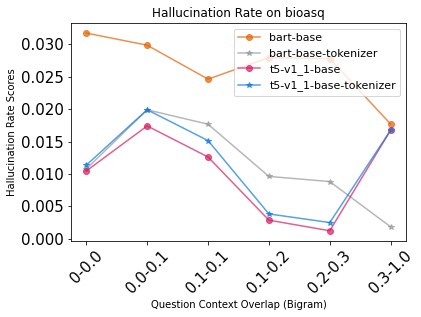

In [ ]:
num_grams= 'Unigram' if n_gram == 1 else 'Bigram'
plotting_utils.plot_perf_wrt_seq(hallu, overlap_rates, 'Question Context Overlap (' + num_grams + ')', display_model_list, metric_name="Hallucination Rate", dataset=dataset)

### Did the improved hallucinted samples leads to the performance gain?
1. Output some samples that was hallucinated before fix, but no longer hallucinated after fix
2. Check if these samples leads to performance gain

In [6]:
importlib.reload(token_exp_utils)

<module 'utils.token_exp_utils' from '/home/ec2-user/efs/users/huikans/QA-code-base/post_eval_analysis/utils/token_exp_utils.py'>

In [ ]:
# 1. Output some samples that was hallucinated before fix, but no longer hallucinated after fix
pred_changed_instances = token_exp_utils.get_changed_samples(model_name='google/t5-v1_1-base', dataset_name='bioasq', base_dataset='TriviaQA')

In [7]:
# 2. Check if these samples leads to performance gain
overall_F1s, overall_EMs = token_exp_utils.evaluate_on_changed_instances(model_name='google/t5-v1_1-base', dataset_name='bioasq', base_dataset='TriviaQA')

Using custom data configuration default-4db68f511a477386
Reusing dataset csv (/home/ec2-user/.cache/huggingface/datasets/csv/default-4db68f511a477386/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 634.06it/s]
Loading cached processed dataset at /home/ec2-user/.cache/huggingface/datasets/csv/default-4db68f511a477386/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-0321b25494e20793.arrow


In [8]:
print(overall_EMs)
print(overall_F1s)

{'unfixed': 0.06542056074766354, 'fixed': 0.4890965732087227}
{'unfixed': 0.2905341802538065, 'fixed': 0.5460142142385132}


### Confidence on Gold Answers

In order to run the following model confidence experiments, you need to run `confidence_stat.py` to compute the corresponding confidence values. Use the script `exp_scripts/compute_conf_and_perp.sh` to compute all values for one model's all setups.
1. Probability of predicting the gold sequence
2. Perplexity of gold sequence

In [32]:
importlib.reload(token_exp_utils)
importlib.reload(plotting_utils)

<module 'utils.token_exp_utils' from '/home/ec2-user/efs/users/huikans/QA-code-base/post_eval_analysis/utils/token_exp_utils.py'>

## Loss and confidence
### Make Plot for display

In [39]:
def prepare_conf_bar_plot(result_dict, buckets):
    """
    'result_dict' includes the PP/LL/Prob values for each instances
    'buckets' is the corresponding values that the values in result_dict should be grouped into
    returns the bar plot data and the corresponding legend labels
    """
    data_to_plot = []
    legend_labels = []
    for mode in result_dict.keys():
        instance_count = [0 for i in range(len(buckets)-1)]
        for seed in result_dict[mode].keys():
            for value in result_dict[mode][seed]:
                for bucket_idx, bucket in enumerate(buckets[:-1]):
                    if value > bucket and value <= buckets[bucket_idx + 1]:
                        instance_count[bucket_idx] += 1
        data_to_plot.append(instance_count)
        legend_labels.append(mode)
    return data_to_plot, legend_labels

In [27]:
def bootstrap_w_random_seed(dict_to_bootstrap):
    data_list = []
    for key in dict_to_bootstrap.keys():
        # The keys are random seed
        data_list += dict_to_bootstrap[key]
    
    # Bootstrap
    return bootstrap((np.array(data_list),), np.average, confidence_level=0.95, method='percentile')

In [41]:
model_name = 'bart-base'
dataset_name = 'squad'

In [18]:
importlib.reload(token_exp_utils)

<module 'utils.token_exp_utils' from '/home/kaiser/Desktop/QA-code-base/post_eval_analysis/utils/token_exp_utils.py'>

{'fixed_v_unfixedold': {'0': -12100359.523839233, '42': -4201794.645622176, '12345': 19795299.29687382}}
BootstrapResult(confidence_interval=ConfidenceInterval(low=-387580.8064644515, high=2895340.928267996), standard_error=845238.2189741033)


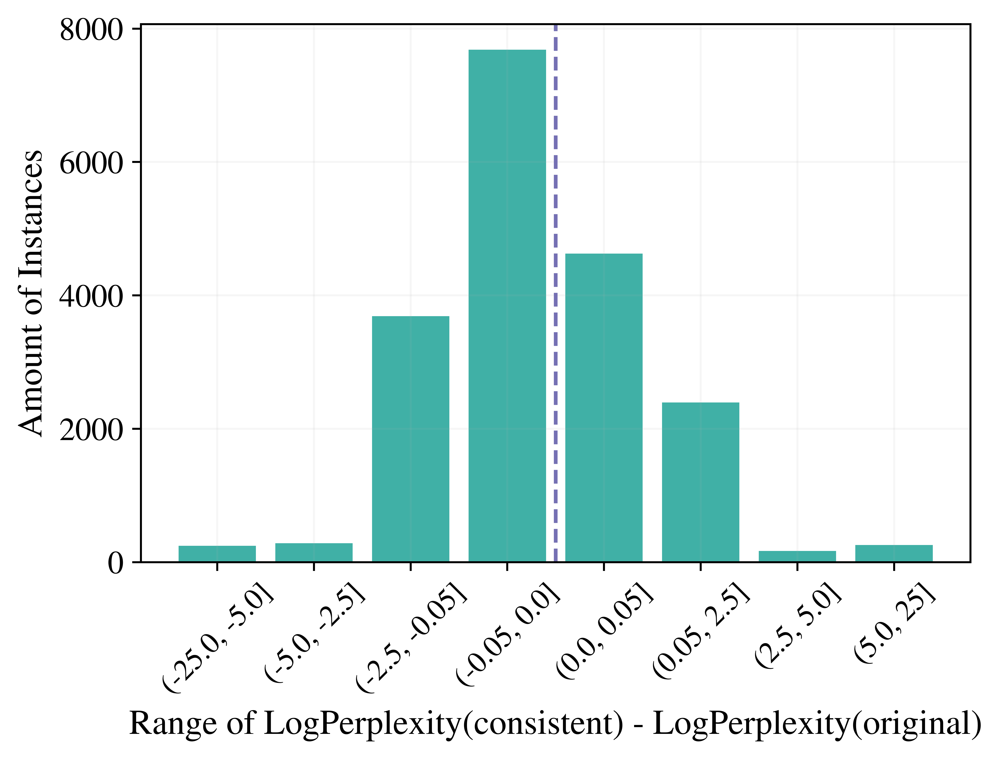

In [43]:
# Compare the models confidence on gold answers before fix and after fix.
from matplotlib import legend


result_avg_dict, result_list_dict = token_exp_utils.confidence_comparison(model_name, data_type='perplexity', dataset_name=dataset_name, compare_type='diff')
print(result_avg_dict)
print(bootstrap_w_random_seed(result_list_dict['fixed_v_unfixedold']))

## Prepare plot for presentation
# Only show fix v unfixed old
result_pre_dict = {"BART-fix v.s. BART": result_list_dict['fixed_v_unfixedold']}
# buckets = [i * 0.5 for i in range(-20, 21, 5)]
buckets = [-25.0, -5.0, -2.5, -0.05, 0.0, 0.05, 2.5, 5.0, 25]
data_to_plot, legend_labels = prepare_conf_bar_plot(result_pre_dict, buckets)

# plotting_utils.bar_plot(data_to_plot, buckets[:-1], legend_labels, ylabel = 'Number of instances', xlabel='LL(BART-fix) - LL(BART-unfixed) for generating gold answer', title='Number of Samples, dataset = ' + dataset_name)

# Create x axis labels
x_axis_labels = ['(' + str(buckets[i-1]) + ', ' + str(buckets[i]) + ']' for i in range(1, len(buckets))]
x = np.arange(len(x_axis_labels))  # the label locations
width = 0.8 / len(data_to_plot)   # the width of the bars, assume there are 
fig, ax = plt.subplots()
ax.grid(alpha=0.1)
for data_idx, data_entry in enumerate(data_to_plot):
    if legend_labels[data_idx] == 'BART-fix v.s. BART':
        legend_txt = 'LL(consistent)-LL(original)'
    rects = ax.bar(x + width * (len(data_to_plot) / 2 - data_idx - 0.5), data_entry, width, color='#40B0A6', alpha=1.0)
# LL(consistent) - LL(original)
ax.set_ylabel("Amount of Instances", fontsize=14)
ax.set_xlabel("Range of LogPerplexity(consistent) - LogPerplexity(original)", fontsize=14)
# ax.set_title(title)
ax.set_xticks(x, x_axis_labels, rotation=45, fontsize=12)
ax.axvline(len(buckets) / 2 - 1, linestyle='--', color='#7570B3')
# ax.legend()
plt.savefig(f"output/fig_files/LL_difference_{dataset_name}.pdf", format="pdf", bbox_inches="tight")
plt.show()

{'fixed_v_unfixedold': {'0': 3.687772093172715, '42': 2.5233089990115043, '12345': -7.020567388287317}}
BootstrapResult(confidence_interval=ConfidenceInterval(low=-0.6909065559734614, high=0.1421617628173685), standard_error=0.2133597482227546)


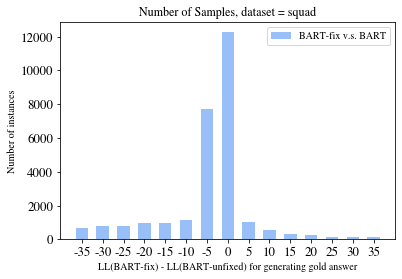

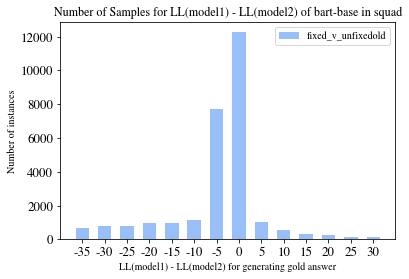

In [12]:
# Compare the models confidence on gold answers before fix and after fix.
result_avg_dict, result_list_dict = token_exp_utils.confidence_comparison(model_name, data_type='prob', dataset_name=dataset_name, compare_type='diff')
print(result_avg_dict)
print(bootstrap_w_random_seed(result_list_dict['fixed_v_unfixedold']))

## Prepare plot for presentation
# Only show fix v unfixed old
result_pre_dict = {"BART-fix v.s. BART": result_list_dict['fixed_v_unfixedold']}
buckets = [i for i in range(-35, 41, 5)]
data_to_plot, legend_labels = prepare_conf_bar_plot(result_pre_dict, buckets)

plotting_utils.bar_plot(data_to_plot, buckets[:-1], legend_labels, ylabel = 'Number of instances', xlabel='LL(BART-fix) - LL(BART-unfixed) for generating gold answer', title='Number of Samples, dataset = ' + dataset_name)

# Uncomment the following lines for plotting the whole values
# The tail is very long so the plot may look unpleasant
# # Get bucket for ratios (start, end)
# start, end = 0, 0
# total_instances = 0
# for mode in result_list_dict.keys():
#     for seed in result_list_dict[mode].keys():
#         total_instances += len(result_list_dict[mode][seed])
#         if max(result_list_dict[mode][seed]) >= end:
#             end = max(result_list_dict[mode][seed])
#         if min(result_list_dict[mode][seed]) <= start:
#             start = min(result_list_dict[mode][seed])
buckets = [i for i in range(-35, 40, 5)]
data_to_plot, legend_labels = prepare_conf_bar_plot(result_list_dict, buckets)

plotting_utils.bar_plot(data_to_plot, buckets[:-1], legend_labels, ylabel = 'Number of instances', xlabel='LL(model1) - LL(model2) for generating gold answer', title='Number of Samples for LL(model1) - LL(model2) of ' + model_name + ' in ' + dataset_name)

In [ ]:
# Compare the difference in loss
result_avg_dict, result_list_dict = token_exp_utils.confidence_comparison(model_name, 'loss', 'diff')
print(result_avg_dict)

buckets = [i for i in range(-3, 5, 1)]
data_to_plot, legend_labels = prepare_conf_bar_plot(result_list_dict, buckets)

plotting_utils.bar_plot(data_to_plot, buckets[:-1], legend_labels, ylabel = 'Number of instances', xlabel='Difference in Loss', title='Number of Samples for different loss of ' + model_name + ' in ' + dataset_name)

{'fixed_v_unfixednew': {'0': 75926187.20537199, '42': -29834.950727725965, '12345': -14311539.71947715}, 'fixed_v_unfixedold': {'0': 66756037.44464032, '42': -12833439.506352017, '12345': 14384.381107443336}, 'unfixednew_v_unfixedold': {'0': -9170149.760731807, '42': -12803604.555624258, '12345': 14325924.100584624}}


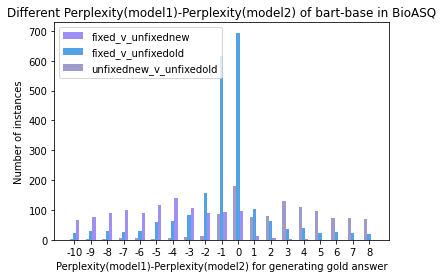

In [9]:
# Compute the difference in perplexity of the model before fix and after fix
result_avg_dict, result_list_dict = token_exp_utils.confidence_comparison(model_name, 'perplexity', 'diff')
print(result_avg_dict)
buckets = [i for i in range(-10, 10, 1)]
data_to_plot, legend_labels = prepare_conf_bar_plot(result_list_dict, buckets)

plotting_utils.bar_plot(data_to_plot, buckets[:-1], legend_labels, ylabel = 'Number of instances', xlabel='Perplexity(model1)-Perplexity(model2) for generating gold answer', title='Different Perplexity(model1)-Perplexity(model2) of ' + model_name + ' in BioASQ')

#### Count of intances for a specified type (No comparison)

In [23]:
result_dict = token_exp_utils.confidence_stat(model_name, 'prob', dataset_name='duorc')

In [24]:
buckets = [i/10.0 for i in range(11)]
# Count the amount of instances in the bucket

data_to_plot = []
legend_labels = []
for mode in result_dict.keys():
    instance_count = [0 for i in range(10)]
    for seed in result_dict[mode].keys():
        for value in result_dict[mode][seed]:
            for bucket_idx, bucket in enumerate(buckets[:-1]):
                if value >= bucket and value < buckets[bucket_idx + 1]:
                    instance_count[bucket_idx] += 1
    data_to_plot.append(instance_count)
    legend_labels.append(mode)

[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
[[3175, 87, 75, 40, 74, 54, 66, 93, 153, 686], [3403, 79, 62, 48, 45, 44, 51, 52, 96, 623], [4357, 9, 9, 5, 7, 4, 2, 3, 6, 101]]


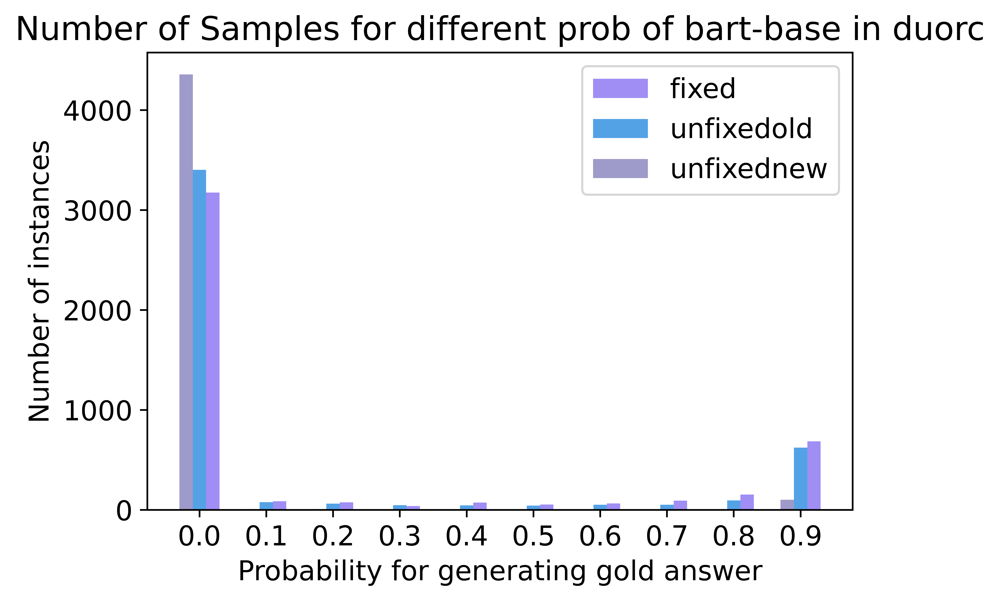

In [25]:
print(buckets[:-1])
print(data_to_plot)
plotting_utils.bar_plot(data_to_plot, buckets[:-1], legend_labels, ylabel = 'Number of instances', xlabel='Probability for generating gold answer', title='Number of Samples for different prob of ' + model_name + ' in ' + dataset_name)

### Calibration Experiment

In [11]:
importlib.reload(token_exp_utils)

<module 'utils.token_exp_utils' from '/home/kaiser/Desktop/QA-code-base/post_eval_analysis/utils/token_exp_utils.py'>

In [38]:
target_dataset = 'squad'
f1_list, em_list, prob_list = token_exp_utils.calibration_experiment(model_name='facebook/bart-base', target_dataset=target_dataset)

tok_f1_list, tok_em_list, tok_prob_list = token_exp_utils.calibration_experiment(model_name='facebook/bart-base-tokenizer', target_dataset=target_dataset)

Using custom data configuration default-cd9da4042ee60361
Reusing dataset csv (/home/kaiser/.cache/huggingface/datasets/csv/default-cd9da4042ee60361/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 717.22it/s]
Loading cached processed dataset at /home/kaiser/.cache/huggingface/datasets/csv/default-cd9da4042ee60361/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-1e9e345297369b62.arrow
Using custom data configuration default-cd9da4042ee60361
Reusing dataset csv (/home/kaiser/.cache/huggingface/datasets/csv/default-cd9da4042ee60361/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519)
100%|██████████| 1/1 [00:00<00:00, 763.02it/s]
Loading cached processed dataset at /home/kaiser/.cache/huggingface/datasets/csv/default-cd9da4042ee60361/0.0.0/433e0ccc46f9880962cc2b12065189766fbb2bee57a221866138fb9203c83519/cache-1e9e345297369b62.arrow


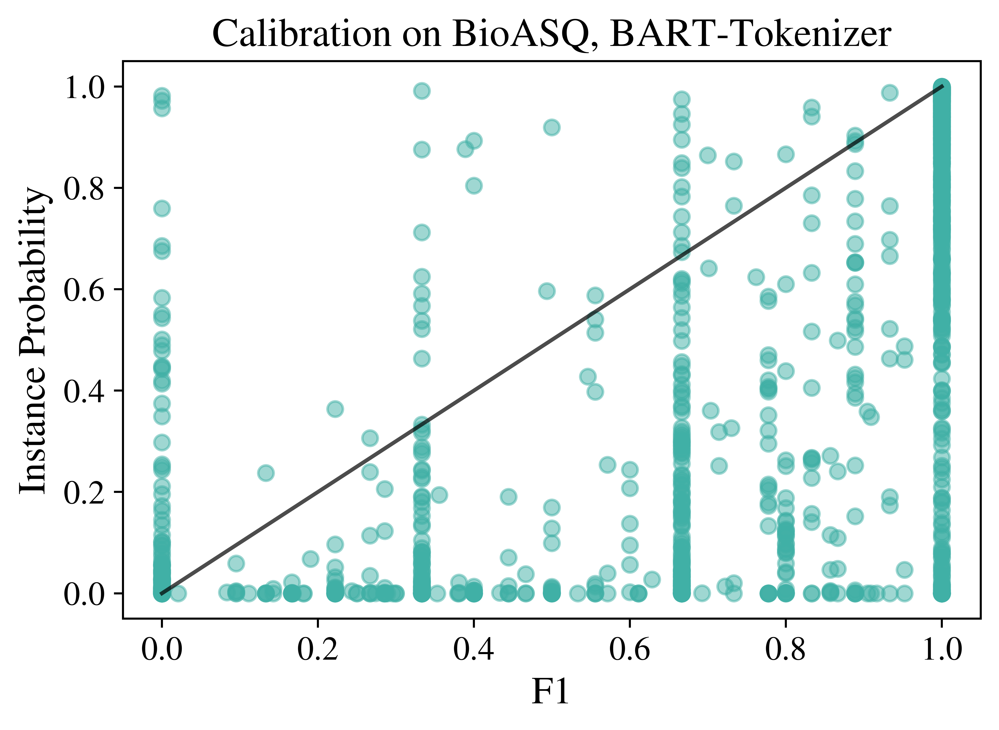

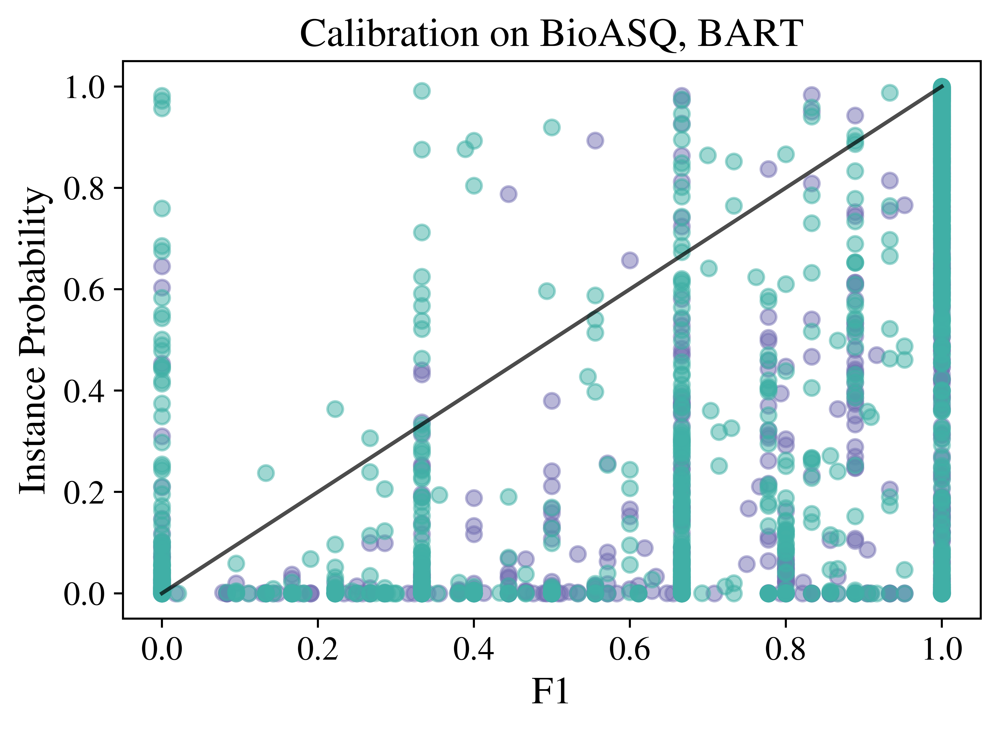

[0.6666666666666666, 0.7083333333333333, 1.0, 0.6666666666666666, 0.8888888888888888, 0.7777777777777778, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.8333333333333333, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.4444444444444444, 0.6666666666666666, 0.6666666666666666, 0.0, 0.09523809523809525, 0.24444444444444444, 0.0, 0.0, 0.0, 0.0, 1.0, 0.19047619047619047, 0.2222222222222222, 0.2857142857142857, 0.19047619047619047, 0.8, 0.2571428571428571, 0.380952380952381, 0.0, 0.0, 0.0, 0.6285714285714286, 0.8, 0.8, 0.8, 0.0, 0.8, 0.8, 0.8, 0.0, 0.8, 1.0, 0.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0.0, 0.6666666666666666, 0.0, 0.0, 1.0, 0.4, 1.0, 1.0, 0.8333333333333333, 0.0, 0.6, 0.7777777777777778, 1.0, 1.0, 1.0, 0.8888888888888888, 1.0, 1.0, 0.3333333333333333, 1.0, 0.0, 0.26666666666666666, 0.4444444444444

In [20]:
# Create plotting code to compare the callibration
alpha=0.3
metric_name = 'F1'
plt.scatter(tok_f1_list, tok_prob_list, c='#40B0A6', alpha=0.5)
plt.ylabel('Instance Probability', fontsize=15)
plt.xlabel(metric_name, fontsize=15)
plt.plot([0, 1.0], [0, 1.0], c='#000000', alpha=0.7)
plt.title('Calibration on BioASQ, BART-Tokenizer')
plt.show()
plt.scatter(f1_list, prob_list, c='#7570B3', alpha=0.5)
# plt.scatter(tok_f1_list, tok_prob_list, c='#40B0A6', alpha=0.5)

plt.ylabel('Instance Probability', fontsize=15)
plt.plot([0, 1.0], [0, 1.0], c='#000000', alpha=0.7)
plt.xlabel(metric_name, fontsize=15)
plt.title('Calibration on BioASQ, BART')
plt.show()
print(f1_list)

In [28]:
# Plot by buckets
def create_buckets(metric_list, prob_list):
    prob_buckets = [0.1 * x for x in range(10)]
    avg_performance = [0] * len(prob_buckets)
    number_of_samples = [0] * len(prob_buckets)
    x_axis_label = []

    # Loop through the probability and metric
    for instance_idx, prob in enumerate(prob_list):
        # Find which bucket the instance belongs to
        for bucket_idx, bucket_lower_bound in enumerate(prob_buckets):
            if prob >= bucket_lower_bound and prob < bucket_lower_bound + 0.1:
                instance_bucket_idx = bucket_idx
                break
        
        # Add the number of samples and performance
        avg_performance[instance_bucket_idx] += metric_list[instance_idx]
        number_of_samples[instance_bucket_idx] += 1
    
    for idx, _ in enumerate(avg_performance):
        avg_performance[idx] = avg_performance[idx] / number_of_samples[idx] if number_of_samples[idx] != 0 else 0
        x_axis_label.append('[' + str(round(prob_buckets[idx], 1)) + ', ' + str(round(prob_buckets[idx] + 0.1, 1)) + ']')
    return avg_performance, x_axis_label, prob_buckets

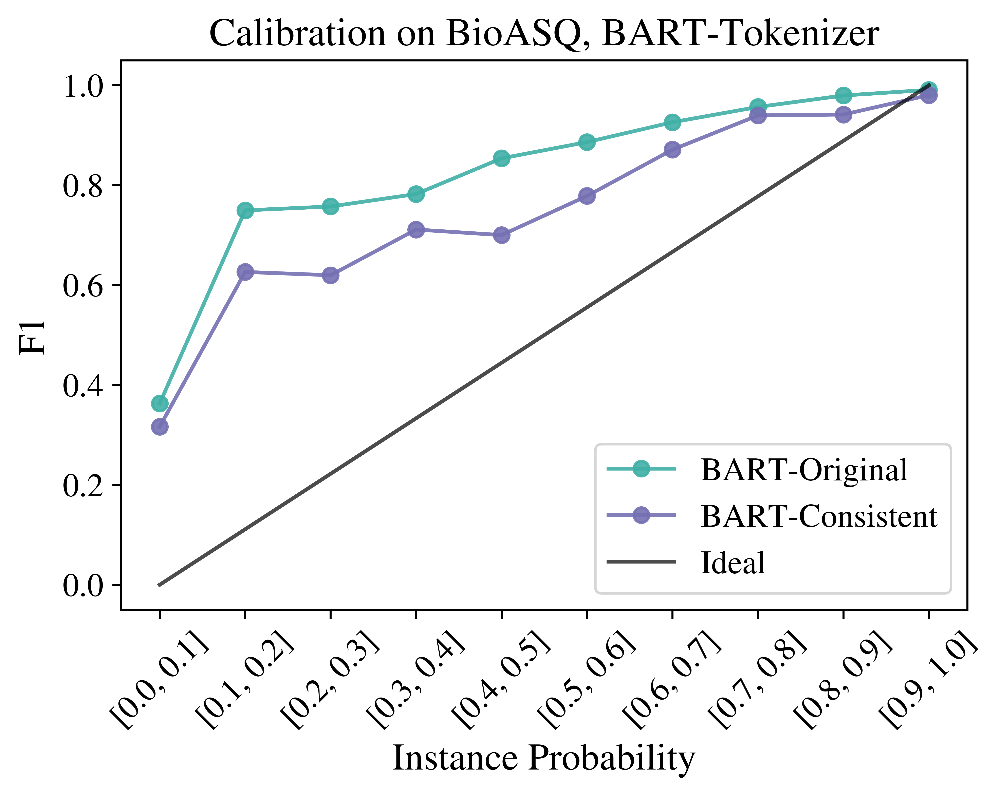

In [37]:
alpha=0.9
metric_name = 'F1'
avg_performance, x_axis_label, prob_buckets = create_buckets(f1_list, prob_list)
tok_avg_performance, _, _ = create_buckets(tok_f1_list, tok_prob_list)

plt.plot(prob_buckets, avg_performance, c='#40B0A6', alpha=alpha, linestyle='-', marker='o', label="BART-Original")
plt.plot(prob_buckets, tok_avg_performance, c='#7570B3', alpha=alpha, linestyle='-', marker='o', label="BART-Consistent")
plt.ylabel(metric_name, fontsize=15)
plt.xlabel('Instance Probability', fontsize=15)
plt.xticks(prob_buckets, labels=x_axis_label, rotation=45)
plt.plot([0, 0.9], [0, 1.0], c='#000000', alpha=0.7, label="Ideal")
plt.legend(loc='lower right')
plt.title('Calibration on SQuAD, BART-Tokenizer')
plt.show()
# plt.scatter(f1_list, prob_list, c='#7570B3', alpha=0.5)
# plt.scatter(tok_f1_list, tok_prob_list, c='#40B0A6', alpha=0.5)
